#***Run Everything to visualize every graphs and decision tree***

#Cloning the github to access to every file and libaries provided

In [ ]:
###### Set Up #####
# verify our folder with the data and module assets is installed
# if it is installed make sure it is the latest
!test -e ds-assets && cd ds-assets && git pull && cd ..
# if it is not installed clone it 
!test ! -e ds-assets && git clone https://github.com/IndraniMandal/ds-assets.git
# point to the folder with the assets
home = "ds-assets/assets/" 
import sys
sys.path.append(home)      # add home folder to module search path

Cloning into 'ds-assets'...
remote: Enumerating objects: 171, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 171 (delta 1), reused 2 (delta 0), pack-reused 164
Receiving objects: 100% (171/171), 7.40 MiB | 36.43 MiB/s, done.
Resolving deltas: 100% (61/61), done.


Importing the libaries needed and the default.csv files to obtain the data sets

In [ ]:
import pandas as pd
from treeviz import tree_print
import numpy as np
from matplotlib import pyplot as plt
from google.colab import files
data_to_load = files.upload()
import io

Saving Default.csv to Default.csv


Reading the Default.csv file

In [ ]:
file_name = "Default.csv"

default_df = pd.read_csv(io.BytesIO(data_to_load[file_name]))


Printing all the columns in default_df

In [ ]:
default_df.columns

Index(['default', 'student', 'balance', 'income'], dtype='object')

Deleting the "unamed: 0" column as it doesn't carry any important value that would support my decision trees or graphs

In [ ]:
default_df.drop("Unnamed: 0", axis = 1, inplace = True)

Visualizing the first 10 rows of the default_df data frame

In [ ]:
default_df.head(10)

,default,student,balance,income
0,No,No,729.526495,44361.625074
1,No,Yes,817.180407,12106.134700
2,No,No,1073.549164,31767.138947
3,No,No,529.250605,35704.493935
4,No,No,785.655883,38463.495879
5,No,Yes,919.588530,7491.558572
6,No,No,825.513331,24905.226578
7,No,Yes,808.667504,17600.451344
8,No,No,1161.057854,37468.529288
9,No,No,0.000000,29275.268293


In [ ]:
import seaborn as sns
sns.set()

#Density Plots

###The density plot for the balance column

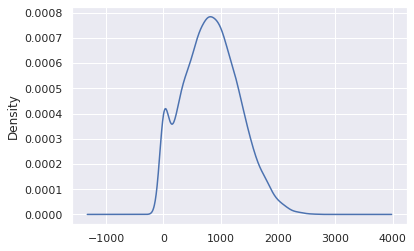

In [ ]:
default_df.loc[:,"balance"].plot.kde()

###The density plot for the income column

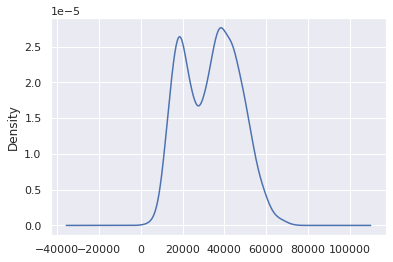

In [ ]:
default_df.loc[:,"income"].plot.kde()

Replacing the yes and no values from the default_df and student column to convert their dtype into integers, the no and yes values would be represented by zero and one respectively

In [ ]:
default_df.default.replace(["No", "Yes"], [0,1], inplace = True)
default_df.student.replace(["No", "Yes"], [0,1], inplace = True)

Viewing the dataframe with the replace values of the 

In [ ]:
default_df.head()

,default,student,balance,income
0,0,0,729.526495,44361.625074
1,0,1,817.180407,12106.134700
2,0,0,1073.549164,31767.138947
3,0,0,529.250605,35704.493935
4,0,0,785.655883,38463.495879


Printing the data types for each column

In [ ]:
default_df.dtypes

default      int64
student      int64
balance    float64
income     float64
dtype: object

Viewing how many people defaulted on their credit cards 

In [ ]:
default_sum_df = default_df[default_df.default == 1]
default_sum_df.count()

default    333
student    333
balance    333
income     333
dtype: int64

#Scatter plot of the people who defaulted on their credit to visualize any trend between income and balance

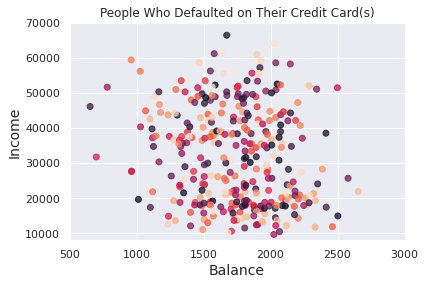

In [ ]:
np.random.seed(19680801)
total_num = 333
colors = np.random.rand(total_num)
plt.title("People Who Defaulted on Their Credit Card(s)")
plt.scatter(x = default_sum_df.balance, y = default_sum_df.income, c = colors, alpha = .75)
plt.ylabel("Income", fontsize = 14)
plt.xlabel("Balance", fontsize = 14)
plt.axis([500,3000,8000,70000])
plt.show()

###Visualizing every variables to each other to see any tendency or pattern that would explain the group of people who defaulted the most, and what variables have the strongest connection

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


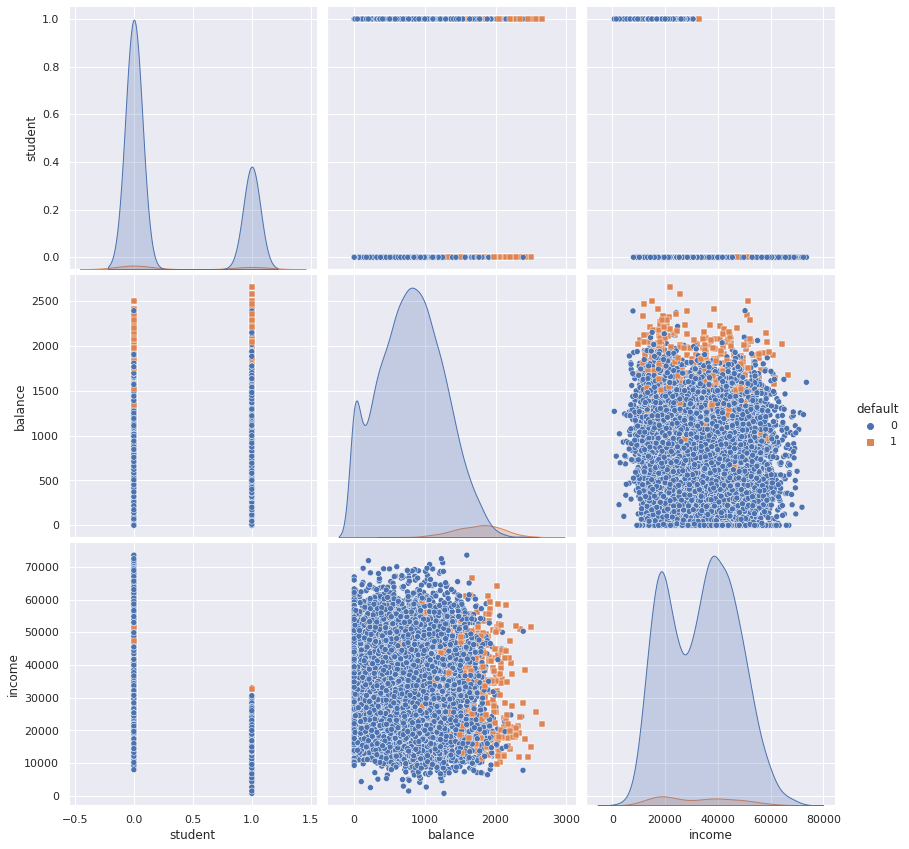

In [ ]:
sns.pairplot(default_df, hue = "default",size = 4,  markers=["o", "s"])

#Zero represent false and one represent true

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,


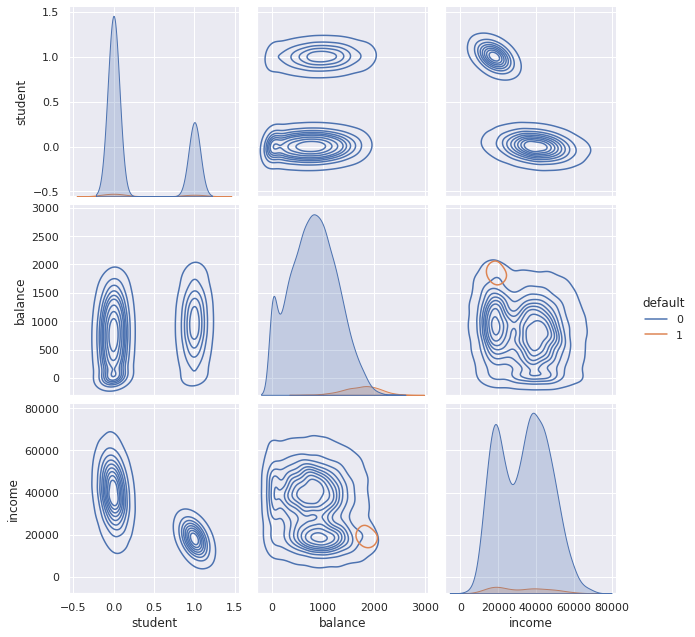

In [ ]:
sns.pairplot(default_df, hue = "default", kind = "kde",size = 3)

### Making a scatter plot to show the relationship between if the person was a student and the balace that resulted in a credit card default

In [ ]:
defaulted_df = default_df[default_df.default == 1]
did_not_defaulted_df = default_df[default_df.default == 0]

Text(0.5, 1.0, 'The Relationship Between the People who Defaulted and Balance')

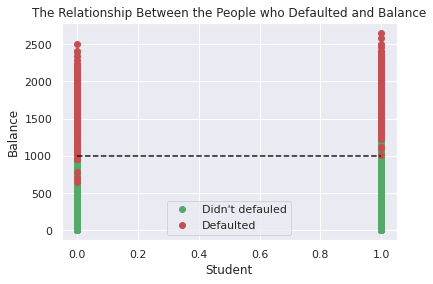

In [ ]:
plt.plot(did_not_defaulted_df["student"], did_not_defaulted_df["balance"], "go")
plt.plot(defaulted_df["student"], defaulted_df["balance"], "ro")
plt.xlabel("Student")
plt.ylabel("Balance")
plt.legend(["Didn't defauled", "Defaulted"])
plt.plot([0,1.0], [1000,1000], "k--")
plt.title("The Relationship Between the People who Defaulted and Balance")


###he results of this scatter plot showcases that that student have the tendency to default more on the credit card(s); However, another tendency that was illustrated that no matter if the person was a student, if the person has a balance over 1000 dollars they composed the majority of the people who defaulted

In [ ]:
import sys

if 'google.colab' in sys.modules:
  !pip install -q dtreeviz

     |████████████████████████████████| 72 kB 690 kB/s 


In [ ]:
from dtreeviz.trees import *
from IPython.display import Image, display_svg, SVG

Obtain the target and features data frame

In [ ]:
features_df  = default_df.drop(["default"],axis=1)
target_df = default_df['default']

#Making a restriced decision tree with a max depth of one

##Printing out the decision tree

In [ ]:
dtree = tree.DecisionTreeClassifier(criterion = "entropy", max_depth = 1)
dtree.fit(features_df, target_df)
tree_print(dtree, features_df)

if balance =< 1472.9915161132812: 
  |then 0
  |else 0
<->
Tree Depth:  1


In [ ]:
viz_tree = dtreeviz(dtree,
                    features_df,
                    target_df,
                    target_name = "Defaulted",
                    feature_names = features_df.columns,
                    class_names = ['False', 'True'])

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


#The visual decision tree with a max depth of one

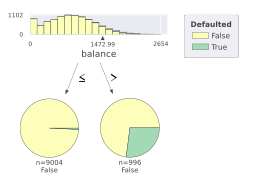

In [ ]:
viz_tree

#Measuring the accuracy rate for the unrestricted 

In [ ]:
from sklearn.metrics import accuracy_score
predicted_array = dtree.predict(features_df)  #predicts a label for the features 
predicted_labels = pd.DataFrame(predicted_array)
#Test for accuracy
print("Our model accuracy is: {}".format(accuracy_score(target_df, predicted_labels
                                                        )))

Our model accuracy is: 0.9667


##The decision tree with a max depth of one has a accuracy rate of 96.67%, which represent a high accuracy for a max depth of one

#Unstricted decision tree

In [ ]:
dtree = tree.DecisionTreeClassifier(criterion = "entropy")
dtree.fit(features_df, target_df)
tree_print(dtree, features_df)

if balance =< 1472.9915161132812: 
  |then if balance =< 1099.0067138671875: 
  |  |then if balance =< 959.1111450195312: 
  |  |  |then if balance =< 652.3849182128906: 
  |  |  |  |then 0
  |  |  |  |else if balance =< 652.4626770019531: 
  |  |  |  |  |then 1
  |  |  |  |  |else if balance =< 780.2002258300781: 
  |  |  |  |  |  |then if balance =< 779.9149169921875: 
  |  |  |  |  |  |  |then if balance =< 698.5698852539062: 
  |  |  |  |  |  |  |  |then if balance =< 698.5397644042969: 
  |  |  |  |  |  |  |  |  |then 0
  |  |  |  |  |  |  |  |  |else 1
  |  |  |  |  |  |  |  |else 0
  |  |  |  |  |  |  |else 1
  |  |  |  |  |  |else 0
  |  |  |else if balance =< 961.7652282714844: 
  |  |  |  |then if balance =< 961.4804382324219: 
  |  |  |  |  |then if balance =< 959.1656188964844: 
  |  |  |  |  |  |then 1
  |  |  |  |  |  |else 0
  |  |  |  |  |else if student =< 0.5: 
  |  |  |  |  |  |then 1
  |  |  |  |  |  |else 0
  |  |  |  |else if balance =< 1012.9926452636719: 
  |  |

In [ ]:
viz_tree = dtreeviz(dtree,
                    features_df,
                    target_df,
                    target_name = "Defaulted",
                    feature_names = features_df.columns,
                    class_names = ['False', 'True'])

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


#Printed out the decision that is unstricted

In [ ]:
viz_tree

#Measuring the accuracy rate for the unrestricted 

In [ ]:
from sklearn.metrics import accuracy_score
predicted_array = dtree.predict(features_df)  #predicts a label for the features 
predicted_labels = pd.DataFrame(predicted_array)
#Test for accuracy
print("Our model accuracy is: {}".format(accuracy_score(target_df, predicted_labels
                                                        )))

Our model accuracy is: 1.0


#The unstricted decision tree has a 100%, which represent a high acurracy rate but the restricted tree was significantly accurate

In [ ]:
from sklearn import tree
from sklearn.metrics import accuracy_score
# sklearn provides manipulation of training sets
# here we do train/test split
from sklearn.model_selection import train_test_split

In [ ]:
default_df.columns

Index(['default', 'student', 'balance', 'income'], dtype='object')

In [ ]:
training_df  = default_df.drop(['default'],axis=1)
target_df = default_df['default']

# split the data - 70% training 30% testing
datasets = train_test_split(training_df, target_df, train_size=0.7, test_size=0.3, random_state=2)
X_train, X_test, y_train, y_test = datasets

In [ ]:
# set up the tree model object - limit the complexity to put us somewhere in the middle of the graph.
model = tree.DecisionTreeClassifier(criterion='entropy', max_depth=4)

# fit the model on the training set of data
model.fit(X_train, y_train)
# tree_print(model,X)

# Train results: evaluate the model on the testing set of data
y_train_model = model.predict(X_train)
print("Train Accuracy: {:3.2f}".format(accuracy_score(y_train, y_train_model)))

# Test results: evaluate the model on the testing set of data
y_test_model = model.predict(X_test)
print("Test Accuracy: {:3.2f}".format(accuracy_score(y_test, y_test_model)))

Train Accuracy: 0.97
Test Accuracy: 0.97


#Cross Validation 

In [ ]:
import pandas as pd
import numpy as np
np.set_printoptions(formatter={'float_kind':"{:3.2f}".format})
from sklearn import tree
# grab cross validation code
from sklearn.model_selection import cross_val_score

In [ ]:
training_df  = default_df.drop(["default"],axis=1)
target_df = default_df.default

# set up the model
model = tree.DecisionTreeClassifier(criterion='entropy', max_depth= 3)

# do the 5-fold cross validation
scores = cross_val_score(model, training_df, target_df, cv=5)
print("Fold Accuracies: {}".format(scores))
print("Accuracy: {:3.2f}".format(scores.mean()))

Fold Accuracies: [0.97 0.97 0.97 0.97 0.97]
Accuracy: 0.97
